In [1]:
import pandas as pd
import seaborn as sns
import numpy as np
import matplotlib.pyplot as plt


import warnings
warnings.filterwarnings("ignore")

from sklearn.model_selection import train_test_split

from sklearn.preprocessing import MinMaxScaler

from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import BaggingClassifier
from sklearn.ensemble import AdaBoostClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn import svm
from sklearn.neighbors import KNeighborsClassifier
from scipy.stats import zscore

from sklearn.metrics import classification_report
from sklearn import metrics

sns.set(rc={"figure.dpi":300, 'savefig.dpi':300})
plt.rcParams['figure.dpi'] = 300
plt.rcParams['savefig.dpi'] = 300
pd.set_option('display.max_columns',29)

In [2]:
df = pd.read_csv("diabetes.csv")

In [3]:
df.head()

,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age,Outcome
0,6,148,72,35,0,33.6,0.627,50,1
1,1,85,66,29,0,26.6,0.351,31,0
2,8,183,64,0,0,23.3,0.672,32,1
3,1,89,66,23,94,28.1,0.167,21,0
4,0,137,40,35,168,43.1,2.288,33,1


In [4]:
df.isnull().sum()

Pregnancies                 0
Glucose                     0
BloodPressure               0
SkinThickness               0
Insulin                     0
BMI                         0
DiabetesPedigreeFunction    0
Age                         0
Outcome                     0
dtype: int64

In [5]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 768 entries, 0 to 767
Data columns (total 9 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   Pregnancies               768 non-null    int64  
 1   Glucose                   768 non-null    int64  
 2   BloodPressure             768 non-null    int64  
 3   SkinThickness             768 non-null    int64  
 4   Insulin                   768 non-null    int64  
 5   BMI                       768 non-null    float64
 6   DiabetesPedigreeFunction  768 non-null    float64
 7   Age                       768 non-null    int64  
 8   Outcome                   768 non-null    int64  
dtypes: float64(2), int64(7)
memory usage: 54.1 KB


In [6]:
for i in df.columns:
    print(i,len(df[df[i] == 0]))

Pregnancies 111
Glucose 5
BloodPressure 35
SkinThickness 227
Insulin 374
BMI 11
DiabetesPedigreeFunction 0
Age 0
Outcome 500


In [7]:
df[['Glucose', 'BloodPressure', 'SkinThickness', 'Insulin', 'BMI']] = df[['Glucose', 'BloodPressure', 'SkinThickness', 'Insulin', 'BMI']].replace(0,np.nan)
df.isnull().sum()

Pregnancies                   0
Glucose                       5
BloodPressure                35
SkinThickness               227
Insulin                     374
BMI                          11
DiabetesPedigreeFunction      0
Age                           0
Outcome                       0
dtype: int64

In [8]:
df = df.fillna(method = 'ffill')
df = df.fillna(method = 'bfill')
df.isnull().sum()

Pregnancies                 0
Glucose                     0
BloodPressure               0
SkinThickness               0
Insulin                     0
BMI                         0
DiabetesPedigreeFunction    0
Age                         0
Outcome                     0
dtype: int64

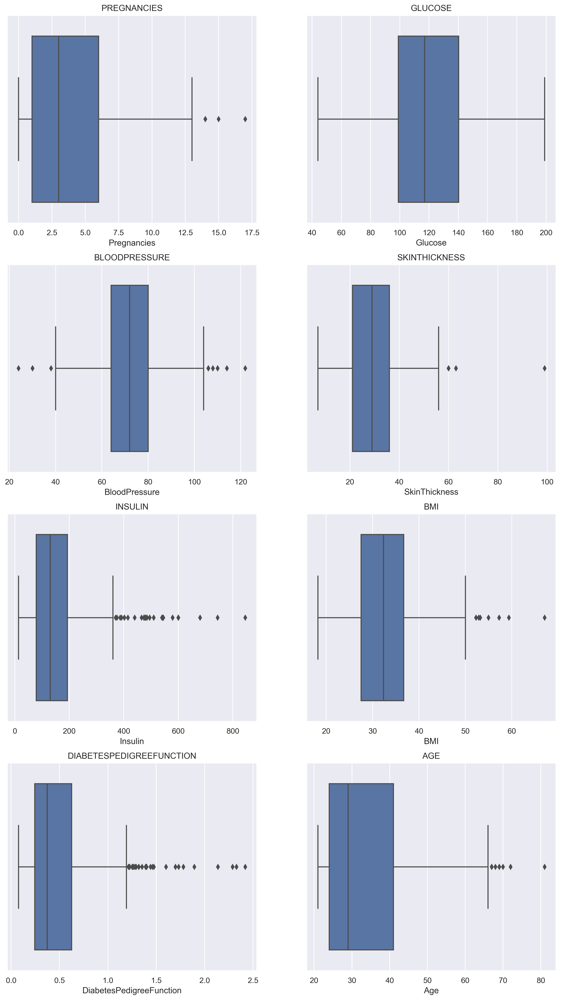

In [9]:
fig1, axes1 =plt.subplots(4,2,figsize=(14, 25))
list1_col= df.columns
for i in range(len(list1_col)-1):
    row=i//2
    col=i%2
    ax=axes1[row,col]
    sns.boxplot(df[list1_col[i]],ax=ax).set(title= list1_col[i].upper())

In [10]:
df.describe()

,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age,Outcome
count,768.000000,768.000000,768.000000,768.000000,768.000000,768.000000,768.000000,768.000000,768.000000
mean,3.845052,121.514323,72.308594,29.257812,157.084635,32.482031,0.471876,33.240885,0.348958
std,3.369578,30.531191,12.375474,10.544310,114.159085,6.908600,0.331329,11.760232,0.476951
min,0.000000,44.000000,24.000000,7.000000,14.000000,18.200000,0.078000,21.000000,0.000000
25%,1.000000,99.000000,64.000000,21.000000,78.750000,27.500000,0.243750,24.000000,0.000000
50%,3.000000,117.000000,72.000000,29.000000,130.000000,32.350000,0.372500,29.000000,0.000000
75%,6.000000,140.250000,80.000000,36.000000,193.250000,36.725000,0.626250,41.000000,1.000000
max,17.000000,199.000000,122.000000,99.000000,846.000000,67.100000,2.420000,81.000000,1.000000


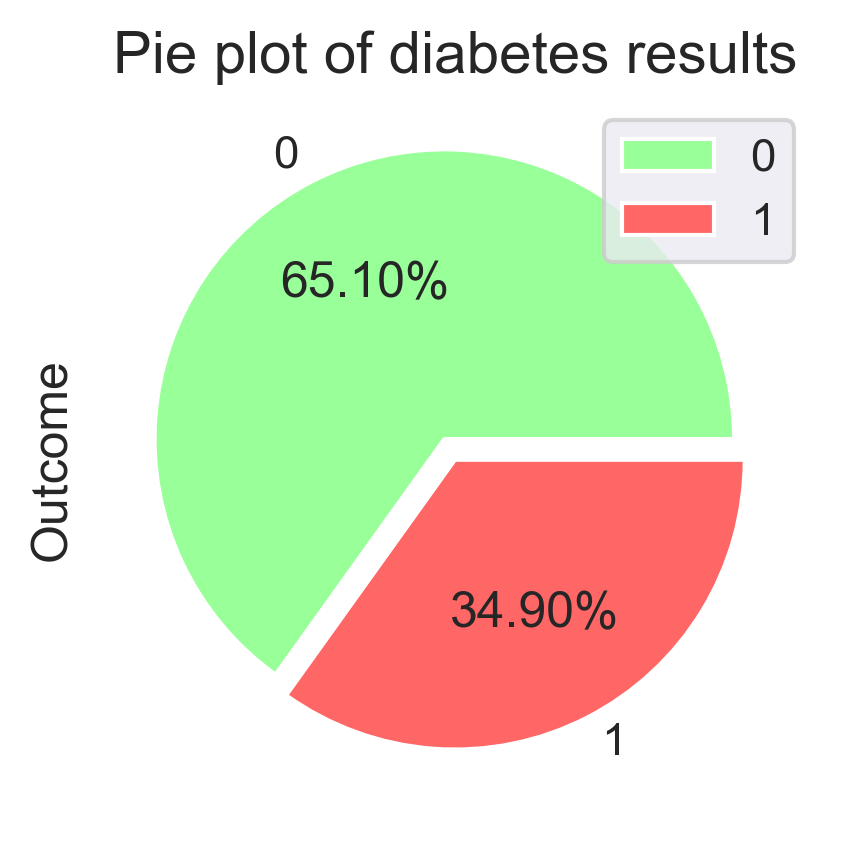

In [11]:
explode=(0.08,0)

df['Outcome'].value_counts().plot.pie(autopct='%1.2f%%',figsize=(3,3),explode=explode,colors=['#99ff99','#ff6666'])
plt.title("Pie plot of diabetes results", fontsize=14)
plt.tight_layout()
plt.legend()
plt.show()

<AxesSubplot:xlabel='Outcome', ylabel='count'>

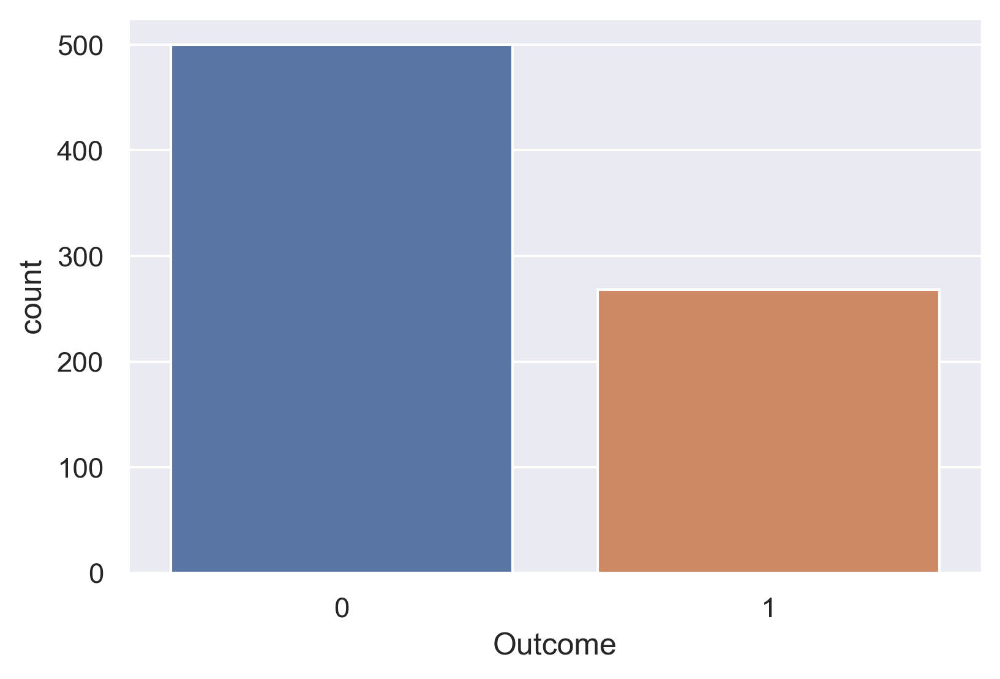

In [12]:
sns.countplot(x = "Outcome", data = df)

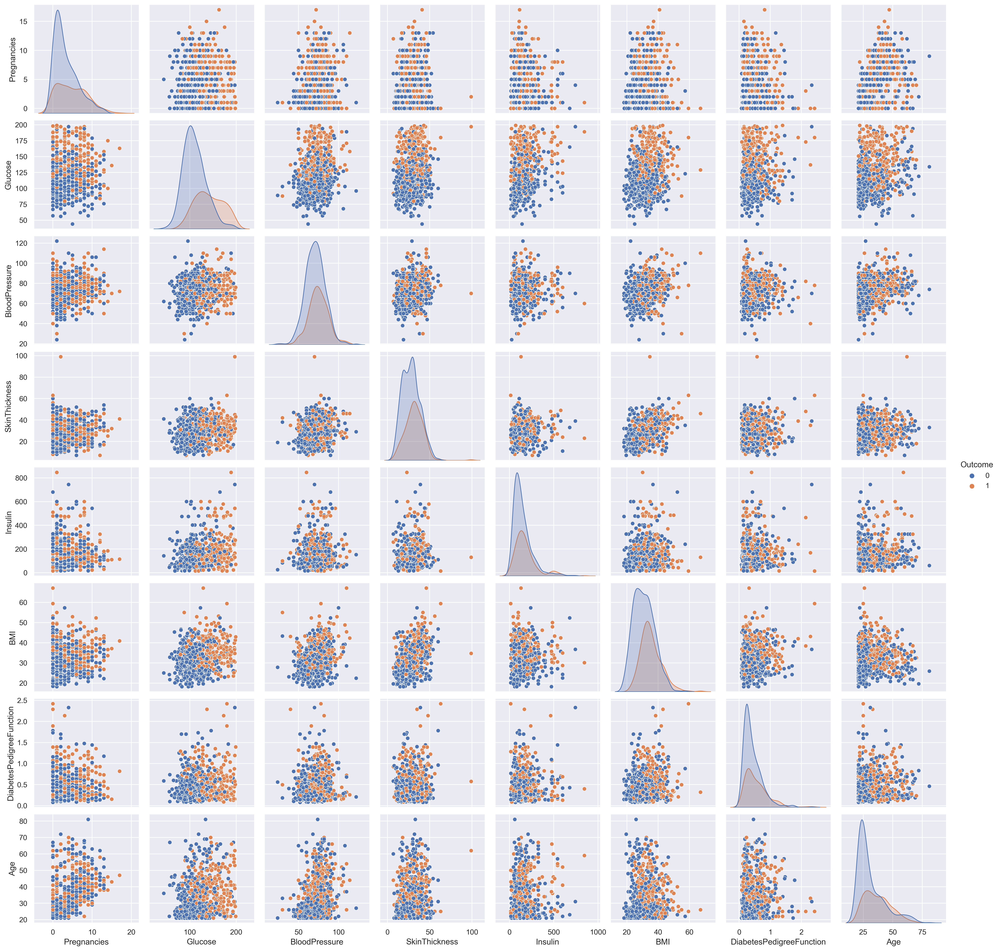

In [13]:
sns.pairplot(df, hue="Outcome", diag_kind="kde")

<AxesSubplot:xlabel='Pregnancies', ylabel='count'>

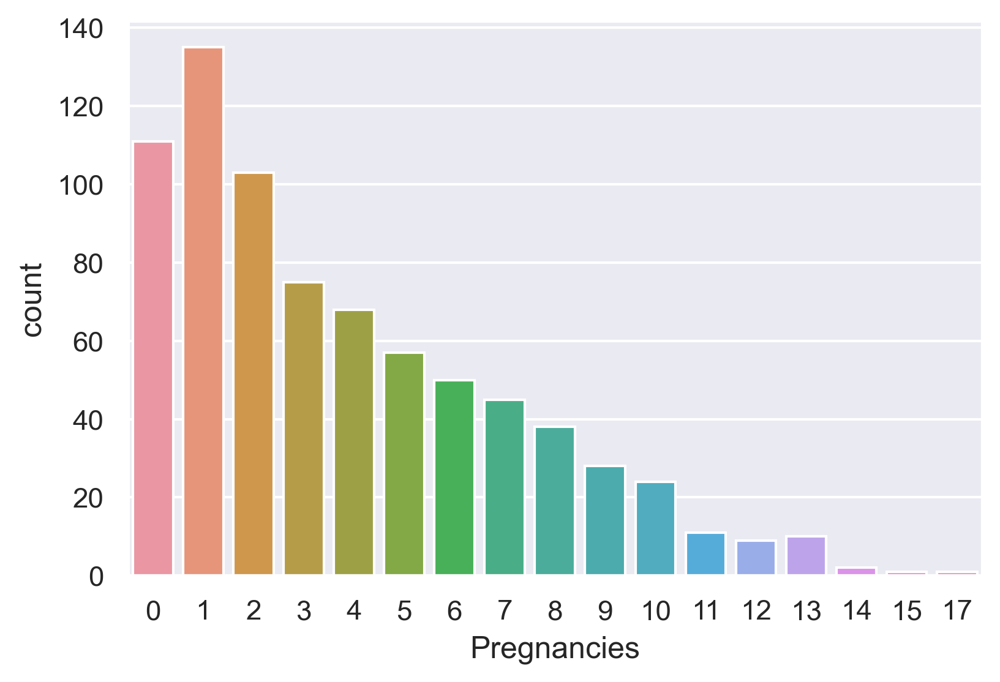

In [14]:
sns.countplot(x = "Pregnancies", data = df)

<AxesSubplot:xlabel='Age', ylabel='count'>

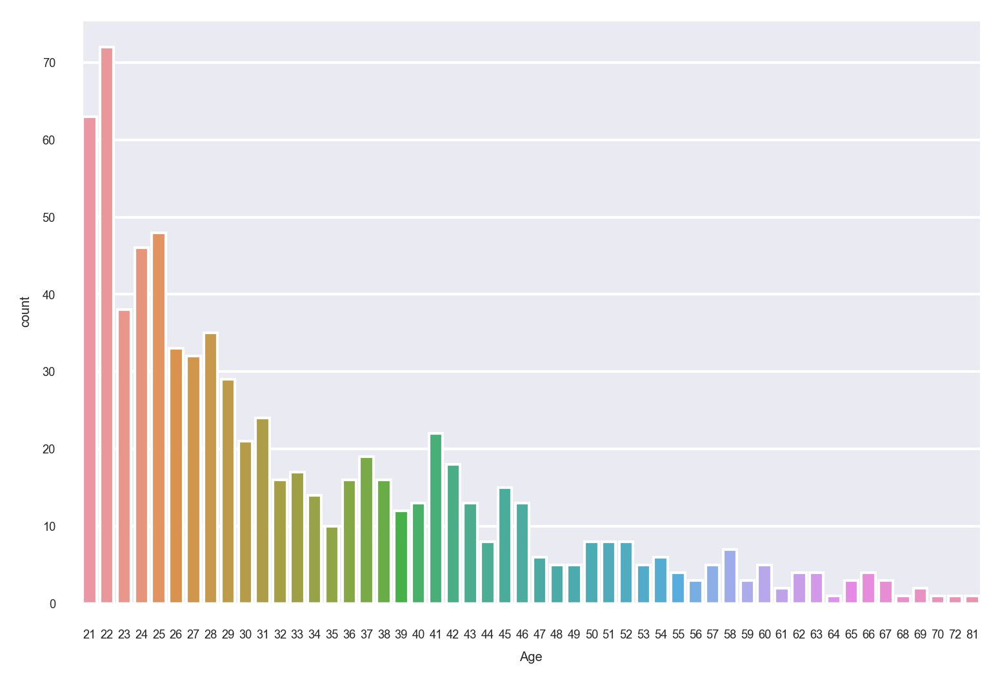

In [15]:
sns.set(font_scale = 0.4)
sns.countplot(x = "Age", data = df)

<AxesSubplot:>

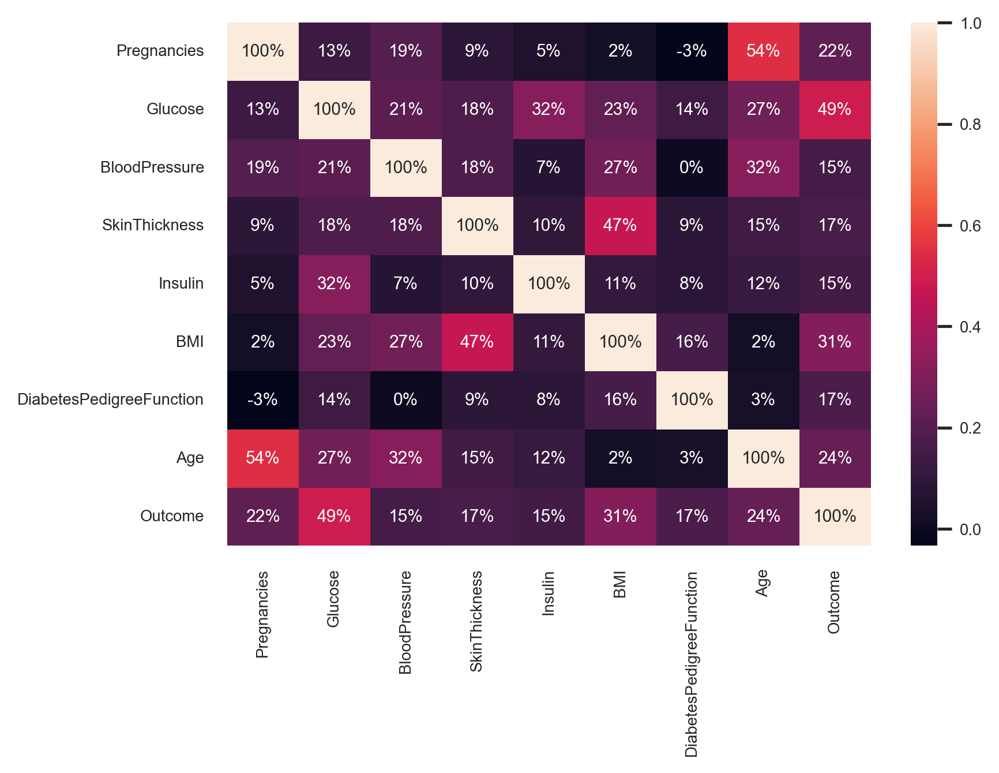

In [16]:
sns.set(font_scale=0.6)
sns.heatmap(df.corr(), annot=True, fmt = '.0%')

In [17]:
scaler = MinMaxScaler()
df[df.columns] = scaler.fit_transform(df[df.columns])
df.head()

,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age,Outcome
0,0.352941,0.670968,0.489796,0.304348,0.096154,0.314928,0.234415,0.483333,1.0
1,0.058824,0.264516,0.428571,0.239130,0.096154,0.171779,0.116567,0.166667,0.0
2,0.470588,0.896774,0.408163,0.239130,0.096154,0.104294,0.253629,0.183333,1.0
3,0.058824,0.290323,0.428571,0.173913,0.096154,0.202454,0.038002,0.000000,0.0
4,0.000000,0.600000,0.163265,0.304348,0.185096,0.509202,0.943638,0.200000,1.0


In [18]:
X = df.drop('Outcome', axis=1)
y = df['Outcome']

In [19]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

X_train.head()

,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age
334,0.058824,0.329032,0.367347,0.119565,0.052885,0.116564,0.077711,0.016667
139,0.294118,0.393548,0.489796,0.239130,0.373798,0.382413,0.034586,0.116667
485,0.000000,0.587097,0.448980,0.380435,0.283654,0.492843,0.122545,0.050000
547,0.235294,0.561290,0.448980,0.152174,0.182692,0.304703,0.035013,0.116667
18,0.058824,0.380645,0.061224,0.336957,0.082933,0.513292,0.044833,0.200000


In [20]:
y_train.head()

334    0.0
139    0.0
485    1.0
547    0.0
18     0.0
Name: Outcome, dtype: float64

In [21]:
X_test.head()

,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age
668,0.352941,0.348387,0.346939,0.282609,0.211538,0.323108,0.150299,0.366667
324,0.117647,0.438710,0.520408,0.271739,0.018029,0.357873,0.029889,0.000000
624,0.117647,0.412903,0.408163,0.217391,0.121394,0.257669,0.034159,0.000000
690,0.470588,0.406452,0.571429,0.423913,0.199519,0.130879,0.332195,0.216667
473,0.411765,0.593548,0.673469,0.217391,0.151442,0.239264,0.056362,0.483333


In [22]:
y_test.head()

668    0.0
324    0.0
624    0.0
690    0.0
473    0.0
Name: Outcome, dtype: float64

In [23]:
model = LogisticRegression()
model.fit(X_train,y_train)

LogisticRegression()

In [24]:
y_pred_lr = model.predict(X_test)

print(metrics.classification_report(y_test, y_pred_lr))

model_score = model.score(X_train,y_train)
print(model_score)

model_score = model.score(X_test,y_test)
print(model_score)

              precision    recall  f1-score   support

         0.0       0.78      0.83      0.81       151
         1.0       0.64      0.56      0.60        80

    accuracy                           0.74       231
   macro avg       0.71      0.70      0.70       231
weighted avg       0.73      0.74      0.74       231

0.7783985102420856
0.7402597402597403


<AxesSubplot:>

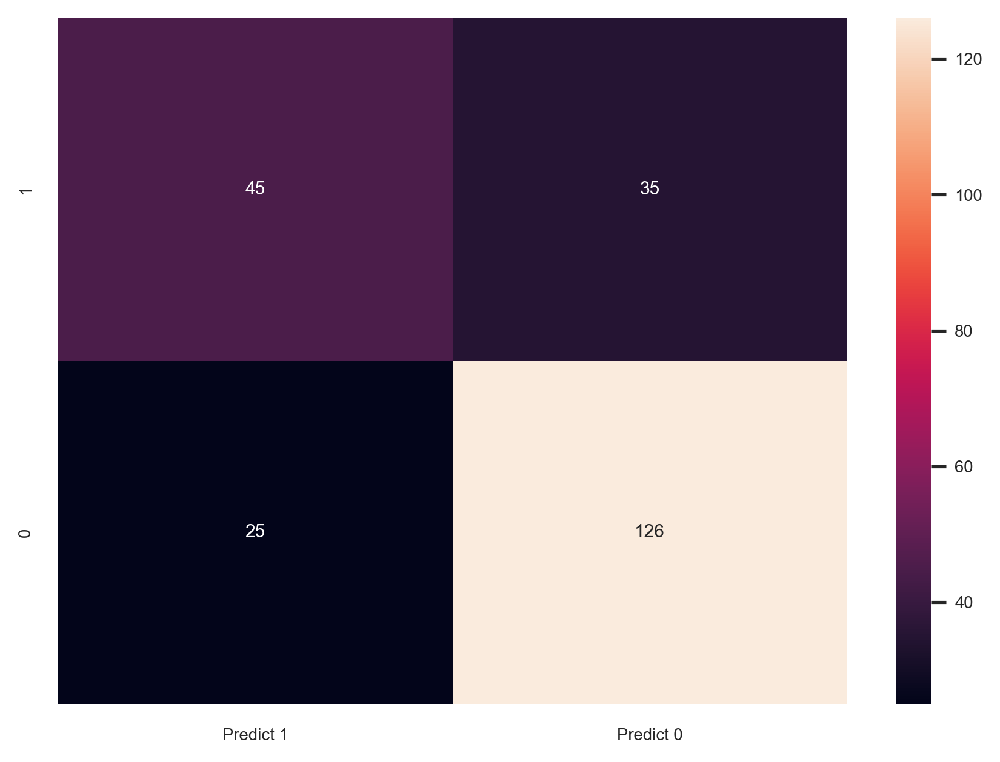

In [25]:
cm = metrics.confusion_matrix(y_test, y_pred_lr, labels=[1,0])

df_cm = pd.DataFrame(cm, index = [i for i in ["1","0"]],
                         columns = [i for i in ["Predict 1", "Predict 0"]])
plt.figure(figsize = (7,5))
sns.heatmap(df_cm, annot=True, fmt='g')

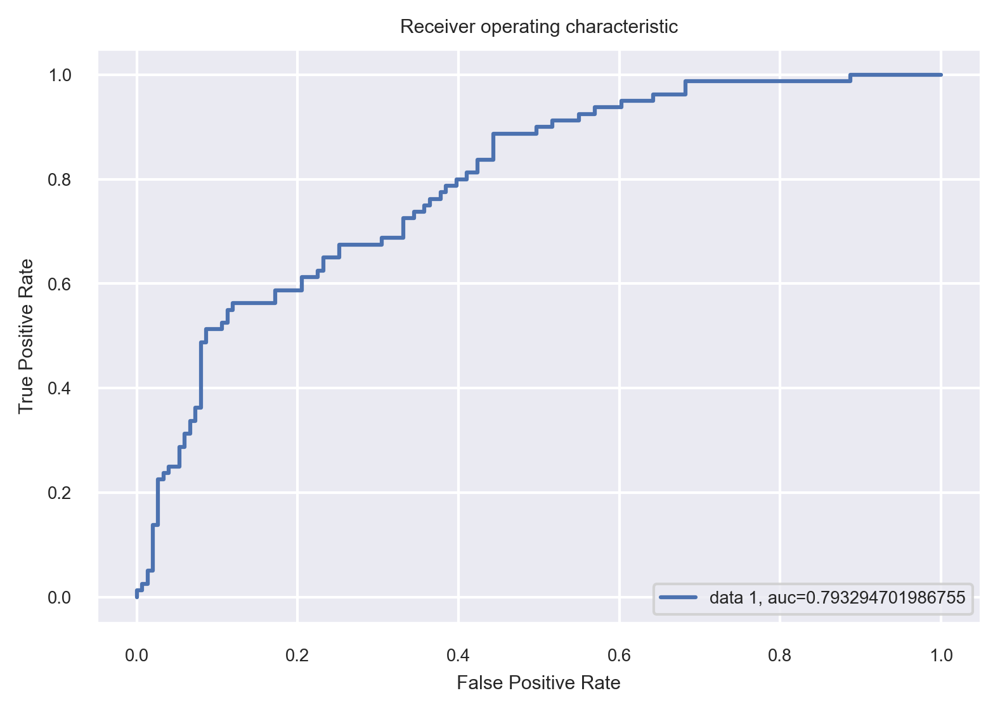

In [26]:
y_pred_proba = model.predict_proba(X_test)[::,1]
fpr, tpr, _ = metrics.roc_curve(y_test, y_pred_proba)
fpr 
tpr

auc = metrics.roc_auc_score(y_test, y_pred_proba)
auc

plt.plot(fpr,tpr,label="data 1, auc="+str(auc))
plt.legend(loc=4)
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver operating characteristic')
plt.legend(loc="lower right")

In [27]:
from sklearn.tree import DecisionTreeClassifier

dTree = DecisionTreeClassifier(criterion = 'gini', max_depth = 4, random_state = 42)
dTree.fit(X_train, y_train)

print(dTree.score(X_train,y_train))
print(dTree.score(X_test,y_test))

0.8007448789571695
0.70995670995671


In [28]:
y_pred_dtree = dTree.predict(X_test)

print(metrics.classification_report(y_test, y_pred_dtree))

              precision    recall  f1-score   support

         0.0       0.84      0.68      0.75       151
         1.0       0.56      0.76      0.65        80

    accuracy                           0.71       231
   macro avg       0.70      0.72      0.70       231
weighted avg       0.75      0.71      0.72       231



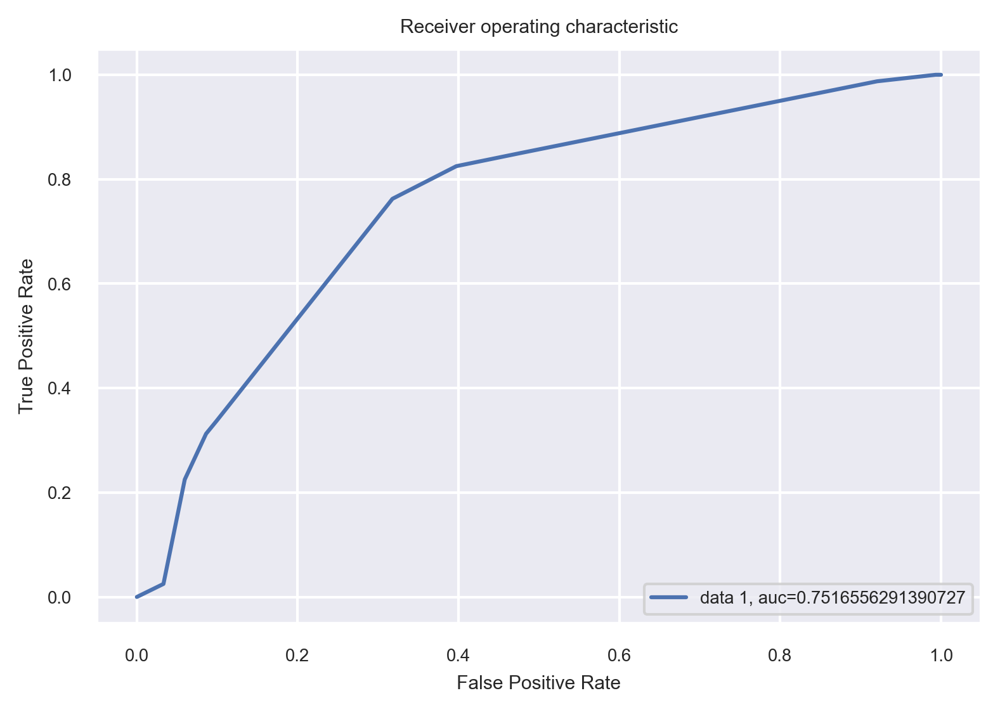

In [29]:
y_pred_proba = dTree.predict_proba(X_test)[::,1]
fpr, tpr, _ = metrics.roc_curve(y_test, y_pred_proba)
fpr 
tpr

auc = metrics.roc_auc_score(y_test, y_pred_proba)
auc

plt.plot(fpr,tpr,label="data 1, auc="+str(auc))
plt.legend(loc=4)
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver operating characteristic')
plt.legend(loc="lower right")

In [30]:
bgcl = BaggingClassifier(n_estimators = 100, base_estimator=dTree, random_state=42)

bgcl = bgcl.fit(X_train, y_train)

In [31]:
y_pred_bag = bgcl.predict(X_test)

print(bgcl.score(X_train,y_train))
print(bgcl.score(X_test,y_test))

0.8472998137802608
0.7186147186147186


In [32]:
print(metrics.classification_report(y_test, y_pred_bag))

              precision    recall  f1-score   support

         0.0       0.79      0.77      0.78       151
         1.0       0.59      0.62      0.61        80

    accuracy                           0.72       231
   macro avg       0.69      0.70      0.69       231
weighted avg       0.72      0.72      0.72       231



<AxesSubplot:>

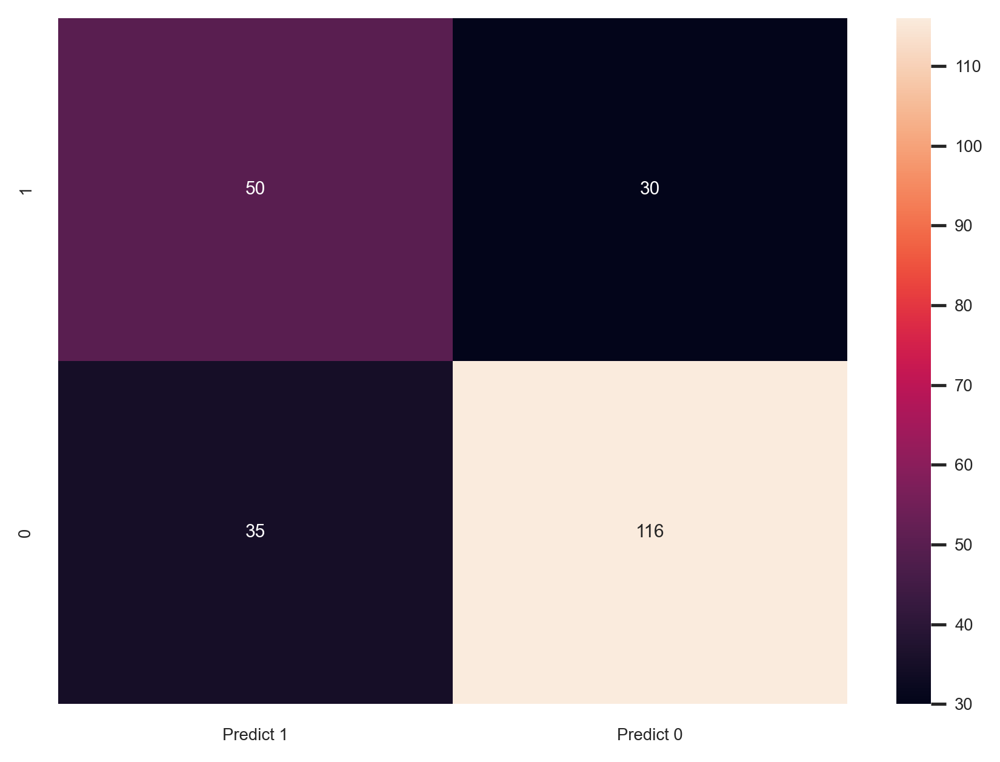

In [33]:
cm = metrics.confusion_matrix(y_test, y_pred_bag, labels=[1,0])

df_cm = pd.DataFrame(cm, index = [i for i in ["1","0"]],
                         columns = [i for i in ["Predict 1", "Predict 0"]])
plt.figure(figsize = (7,5))
sns.heatmap(df_cm, annot=True, fmt='g')

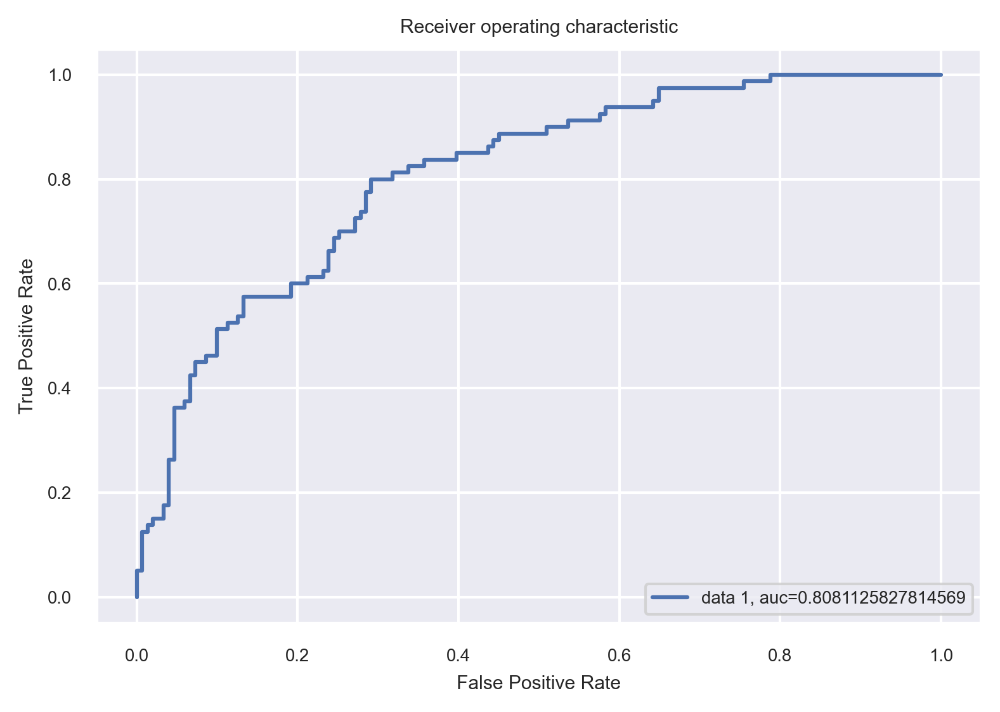

In [34]:
y_pred_proba = bgcl.predict_proba(X_test)[::,1]
fpr, tpr, _ = metrics.roc_curve(y_test, y_pred_proba)
fpr 
tpr

auc = metrics.roc_auc_score(y_test, y_pred_proba)
auc

plt.plot(fpr,tpr,label="data 1, auc="+str(auc))
plt.legend(loc=4)
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver operating characteristic')
plt.legend(loc="lower right")